<a href="https://colab.research.google.com/github/niconielsen32/ObjectTracking/blob/main/ObjectTracking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Get the requirements

In [1]:
# !pip install tf-centernet

In [2]:
# !git clone https://github.com/niconielsen32/ObjectTracking.git
# !pip install -r /content/ObjectTracking/requirements.txt

# Object Tracking with SORT

In [2]:
import sys
import os
# from google.colab import files
import centernet

sys.path.append("/content/ObjectTracking")
from sort import Sort
from lib import VisTrack, show_video, create_video

import numpy as np
import PIL.Image
import cv2
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import shutil
import torch
import torchvision



2023-03-22 11:40:56.375728: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-22 11:40:56.523655: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-03-22 11:40:56.526939: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/sumanth/Desktop/ObjectTracking/env/lib/python3.10/site-packages/cv2/../../lib

## Upload the video you want to work with

In [3]:
# !wget https://viratdata.org/video/VIRAT_S_010204_05_000856_000890.mp4 -O video.mp4
video_file = "cars.mp4"
show_video(video_file)

In [4]:
vt = VisTrack()

# Default: num_classes=80
# obj = centernet.ObjectDetection(num_classes=80)

# num_classes=80 and weights_path=None: Pre-trained COCO model will be loaded.
# obj.load_weights(weights_path=None)

2023-03-22 11:41:02.340223: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-22 11:41:02.340571: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcusolver.so.11'; dlerror: libcusolver.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/sumanth/Desktop/ObjectTracking/env/lib/python3.10/site-packages/cv2/../../lib64:
2023-03-22 11:41:02.340644: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1934] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2023-03-22 11:41:02.34096

## Example image

Using cache found in /home/sumanth/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-3-21 Python-3.10.6 torch-2.0.0+cu117 CUDA:0 (NVIDIA GeForce MX330, 2001MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 
image 1/1: 1080x1920 6 cars
Speed: 2.7ms pre-process, 556.4ms inference, 1.7ms NMS per image at shape (1, 3, 384, 640)


<class 'numpy.ndarray'>
res image 1/1: 1080x1920 6 cars
Speed: 2.7ms pre-process, 556.4ms inference, 1.7ms NMS per image at shape (1, 3, 384, 640)
(1080, 1920, 3)
[[     1204.7      462.94      1498.7      667.26     0.91221           2]
 [     843.37      852.03      1213.5      1074.4     0.88661           2]
 [      776.7      555.33      1073.1      787.44     0.88033           2]
 [     636.89      397.85      877.94      596.92     0.86067           2]
 [      586.1      337.54      780.71      515.66     0.62255           2]
 [     489.33      283.42      674.18      449.71     0.53464           2]] <class 'numpy.ndarray'>


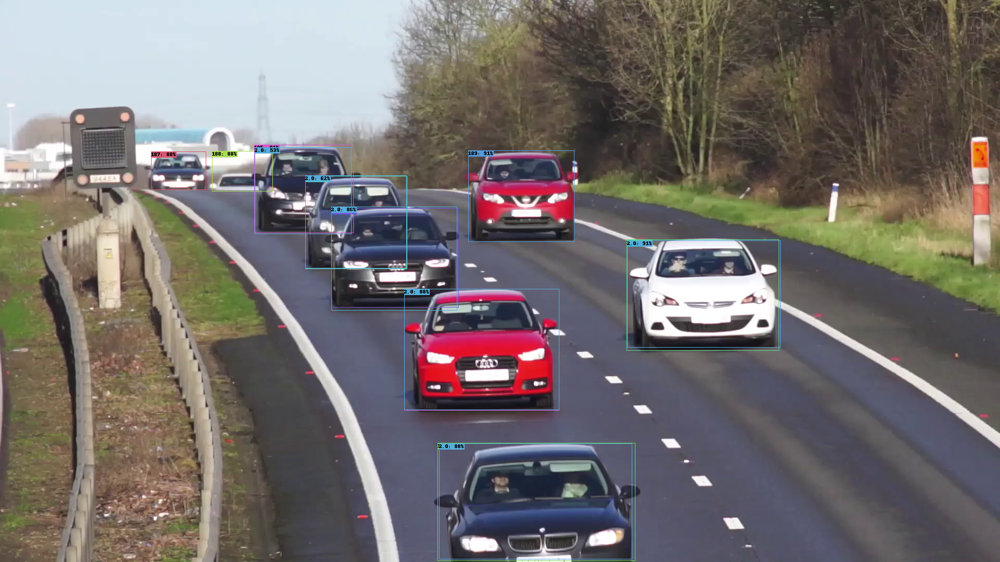

In [5]:
# !wget https://images.squarespace-cdn.com/content/v1/57aa455937c581cbe1aba790/1478015230831-I9TWP5BJX54APXMNPJ7W/ke17ZwdGBToddI8pDm48kBZw6jF4_OvU-ddo_vwqGhp7gQa3H78H3Y0txjaiv_0fDoOvxcdMmMKkDsyUqMSsMWxHk725yiiHCCLfrh8O1z5QPOohDIaIeljMHgDF5CVlOqpeNLcJ80NK65_fV7S1Ub61YCrK70I7JIpWiI8ho4Yi1WvVNQtDE81xuRbL1MFKm0sD-Bab7E9MY8W31A7zMQ/image-asset.jpeg -O img.jpeg 

p_img = PIL.Image.open('Track/000.png')
img = cv2.cvtColor(np.array(p_img), cv2.COLOR_BGR2RGB)



model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
model.classes = [2]
model.conf=0.45
# Inference
results = model(img)
print(type(img))
print("res",results)

# Results
results.print()
# results.save()  # or .show()
print(img.shape)
# print(results.xyxy[0]) # img1 predictions (tensor)
# print(results.pandas().xyxy[0])

results = results.xyxy[0].cpu().detach().numpy()

print(results, type(results))

boxes = results[:,0:4]
classes = results[:,5]
scores = results[:,4]

# boxes, classes, scores = obj.predict(img)

# print(len(boxes), len(classes),len(scores))
# type(boxes),type(classes),type(scores)

vt.draw_bounding_boxes(p_img, boxes, classes, scores)

# print(img)

## Predict on the video

In [35]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
model.classes = [2]
model.conf=0.45
distinct_cars = set()

vidcap = cv2.VideoCapture(video_file)
fps = vidcap.get(cv2.CAP_PROP_FPS)
length = int(vidcap.get(cv2.CAP_PROP_FRAME_COUNT))

folder_out = "Track"
if os.path.exists(folder_out):
    shutil.rmtree(folder_out)
os.makedirs(folder_out)

draw_imgs = []

sort = Sort(max_age=1, min_hits=3, iou_threshold=0.3)

pbar = tqdm(total=length)
i = 0

while True:
    ret, frame = vidcap.read()

    if not ret:
        break
    results = model(frame)
    # results.save()
    results = results.xyxy[0].cpu().detach().numpy()
    boxes = results[:,0:4]
    classes = results[:,5]
    scores = results[:,4]
    # boxes, classes, scores = obj.predict(frame)
    detections_in_frame = len(boxes)
    if detections_in_frame:
        # centernet will do detection on all the COCO classes. "person" is class number 0 
        idxs = np.where(classes == 2)[0]
        boxes = boxes[idxs]
        scores = scores[idxs]
        classes = classes[idxs]
    else:
        boxes = np.empty((0, 5))

    dets = np.hstack((boxes, scores[:,np.newaxis]))
    res = sort.update(dets)

    boxes_track = res[:,:-1]
    boxes_ids = res[:,-1].astype(int)

    p_frame = PIL.Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    for id in boxes_ids:
        distinct_cars.add(id)

    if detections_in_frame:
        p_frame = vt.draw_bounding_boxes(p_frame, boxes_track, boxes_ids, scores)
    p_frame.save(os.path.join(folder_out, f"{i:03d}.png"))

    i+=1
    pbar.update(1)

print(len(distinct_cars))

Using cache found in /home/sumanth/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-3-21 Python-3.10.6 torch-2.0.0+cu117 CUDA:0 (NVIDIA GeForce MX330, 2001MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 
100%|██████████| 266/266 [04:16<00:00,  1.21it/s]

18


### Sort Faster RCNN


In [12]:
from copy import deepcopy

In [33]:
from torchvision import transforms as T

In [54]:
from deep_sort_realtime.deepsort_tracker import DeepSort
import torchreid
# import torchreid.utils

# from deep_sort import nn_matching
# from deep_sort.detection import Detection
# from deep_sort.tracker import Tracker
# from deep_sort import generate_detections as gdet

# model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
model =  torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained = True)
model.eval()
model.classes = [3]
model.conf=0.45
distinct_cars = set()

vidcap = cv2.VideoCapture(video_file)
fps = vidcap.get(cv2.CAP_PROP_FPS)
length = int(vidcap.get(cv2.CAP_PROP_FRAME_COUNT))

folder_out = "Track"
if os.path.exists(folder_out):
    shutil.rmtree(folder_out)
os.makedirs(folder_out)

draw_imgs = []

sort = Sort(max_age=1, min_hits=3, iou_threshold=0.3)

pbar = tqdm(total=length)
i = 0

while True:
    ret, frame = vidcap.read()

    if not ret:
        break
    transform = T.ToTensor()
    results = model(torch.unsqueeze(transform(frame), 0))
    # results.save()
    # print(results[0].keys())
    boxes = results[0]['boxes'].cpu().detach().numpy()
    classes = results[0]['labels'].cpu().detach().numpy()
    scores = results[0]['scores'].cpu().detach().numpy()
    # print(boxes)
    # print(scores)
    print(classes)
    # results = results.xyxy[0].cpu().detach().numpy()
    # boxes = results[:,0:4]
    # classes = results[:,5]
    # scores = results[:,4]
    # boxes, classes, scores = obj.predict(frame)
    detections_in_frame = len(boxes)
    if detections_in_frame:
        # centernet will do detection on all the COCO classes. "person" is class number 0 
        idxs = np.where(classes == 3)[0]
        boxes = boxes[idxs]
        scores = scores[idxs]
        classes = classes[idxs]
    else:
        boxes = np.empty((0, 5))

    #([left,top,w,h], confidence, detection_class)
    # print(boxes)
    # deepSortList = []
    # boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
    # boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
    # # temp[:]
    # # print(boxes.shape)
    # for i in range(scores.shape[0]):
    #     deepSortList.append((boxes[i].tolist(), scores[i], classes[i]))
    # print(deepSortList)

    # tracker = DeepSort(max_age=5, embedder='torchreid')
    # tracks = tracker.update_tracks(deepSortList, frame=frame)
    # print(tracks)
    # break

    dets = np.hstack((boxes, scores[:,np.newaxis]))
    # print(type(dets))
    res = sort.update(dets)

    boxes_track = res[:,:-1]
    boxes_ids = res[:,-1].astype(int)

    p_frame = PIL.Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    for id in boxes_ids:
        distinct_cars.add(id)

    if detections_in_frame:
        p_frame = vt.draw_bounding_boxes(p_frame, boxes_track, boxes_ids, scores)
    p_frame.save(os.path.join(folder_out, f"{i:03d}.png"))

    i+=1
    pbar.update(1)

print(len(distinct_cars))

100%|██████████| 266/266 [42:35<00:00,  9.61s/it]


KeyboardInterrupt: 

## DeepSORT

In [55]:
from deep_sort_realtime.deepsort_tracker import DeepSort
import torchreid
# import torchreid.utils

# from deep_sort import nn_matching
# from deep_sort.detection import Detection
# from deep_sort.tracker import Tracker
# from deep_sort import generate_detections as gdet

# model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
model =  torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained = True)
model.eval()
model.classes = [3]
model.conf=0.45
distinct_cars = set()

vidcap = cv2.VideoCapture(video_file)
fps = vidcap.get(cv2.CAP_PROP_FPS)
length = int(vidcap.get(cv2.CAP_PROP_FRAME_COUNT))

folder_out = "Track"
if os.path.exists(folder_out):
    shutil.rmtree(folder_out)
os.makedirs(folder_out)

draw_imgs = []

sort = Sort(max_age=1, min_hits=3, iou_threshold=0.3)

pbar = tqdm(total=length)
i = 0

while True:
    ret, frame = vidcap.read()

    if not ret:
        break
    transform = T.ToTensor()
    results = model(torch.unsqueeze(transform(frame), 0))
    # results.save()
    # print(results[0].keys())
    boxes = results[0]['boxes'].cpu().detach().numpy()
    classes = results[0]['labels'].cpu().detach().numpy()
    scores = results[0]['scores'].cpu().detach().numpy()
    # print(boxes)
    # print(scores)
    print(classes)
    # results = results.xyxy[0].cpu().detach().numpy()
    # boxes = results[:,0:4]
    # classes = results[:,5]
    # scores = results[:,4]
    # boxes, classes, scores = obj.predict(frame)
    detections_in_frame = len(boxes)
    if detections_in_frame:
        # centernet will do detection on all the COCO classes. "person" is class number 0 
        idxs = np.where(classes == 3)[0]
        boxes = boxes[idxs]
        scores = scores[idxs]
        classes = classes[idxs]
    else:
        boxes = np.empty((0, 5))

    # ([left,top,w,h], confidence, detection_class)
    print(boxes)
    deepSortList = []
    boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
    boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
    # temp[:]
    # print(boxes.shape)
    for i in range(scores.shape[0]):
        deepSortList.append((boxes[i].tolist(), scores[i], classes[i]))
    print(deepSortList)

    tracker = DeepSort(max_age=5, embedder='torchreid')
    tracks = tracker.update_tracks(deepSortList, frame=frame)
    print(tracks)
    break

    dets = np.hstack((boxes, scores[:,np.newaxis]))
    # print(type(dets))
    res = sort.update(dets)

    boxes_track = res[:,:-1]
    boxes_ids = res[:,-1].astype(int)

    p_frame = PIL.Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    for id in boxes_ids:
        distinct_cars.add(id)

    if detections_in_frame:
        p_frame = vt.draw_bounding_boxes(p_frame, boxes_track, boxes_ids, scores)
    p_frame.save(os.path.join(folder_out, f"{i:03d}.png"))

    i+=1
    pbar.update(1)

print(len(distinct_cars))

  0%|          | 0/266 [03:27<?, ?it/s]


[3 3 3 3 3 3 3 1 3 1 3 8 1 1 1 1 8 3 1 9 1 6 6 8 1 8 3 1 1 1 8 1 1 8 1 7 1 8 8 6 8 1 3 1 1 1 6 1 3 1 1 1]
[[     1213.3      461.47      1491.7      671.02]
 [     842.04       859.4      1230.5      1079.2]
 [     629.18      409.63      874.34      585.71]
 [     787.86      560.86        1071      785.76]
 [     489.27       289.9      668.89      445.66]
 [     581.36      345.85      786.05      517.34]
 [      409.5      314.56      510.14      361.56]
 [     898.39      293.66        1105      459.94]
 [     282.52      293.38      397.29      364.63]
 [     391.81      309.36      472.45      358.08]
 [     394.29      291.17      533.67      366.46]
 [     638.12      396.44      807.62      478.01]
 [      45.26         322        1101      1071.7]]
[([1213.2923583984375, 461.469970703125, 278.37451171875, 209.5521240234375], 0.99883837, 3), ([842.0448608398438, 859.4020385742188, 388.40789794921875, 219.81817626953125], 0.9954958, 3), ([629.1841430664062, 409.63043212890625,

ModuleNotFoundError: No module named 'torchreid.utils'

## Show and download the tracking

In [52]:
track_video_file = 'tracking.mp4'
create_video(frames_patten='Track/%03d.png', video_file = track_video_file, framerate=fps)

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [53]:
show_video(track_video_file)